In [4]:
from kaggle_secrets import UserSecretsClient
import json, os, pathlib, subprocess, sys

# --- 1. Load your secret (full JSON from kaggle.json) ---
secret_name = "kaggle_json"  # change if you used another name
user_secrets = UserSecretsClient()
raw = user_secrets.get_secret(secret_name)
creds = json.loads(raw)

# --- 2. Forcefully recreate ~/.kaggle/kaggle.json ---
kaggle_dir = pathlib.Path.home() / ".kaggle"
kaggle_dir.mkdir(parents=True, exist_ok=True)
cred_path = kaggle_dir / "kaggle.json"
cred_path.write_text(json.dumps(creds))
os.chmod(cred_path, 0o600)

# --- 3. Double-check the file actually exists and is readable ---
print("✅ Credentials written to:", cred_path)
!ls -la ~/.kaggle/
#!cat ~/.kaggle/kaggle.json | head -1

# --- 4. Reinstall Kaggle CLI cleanly ---
#!pip install --upgrade --force-reinstall kaggle --quiet



✅ Credentials written to: /root/.kaggle/kaggle.json
total 16
drwxr-xr-x 2 root root 4096 Oct 27 18:57 .
drwx------ 1 root root 4096 Oct 27 18:57 ..
-rw------- 1 root root   72 Oct 27 18:58 kaggle.json


In [5]:
!kaggle competitions files -c aml-competition
!kaggle competitions download -c aml-competition -p /kaggle/working --force
!mkdir -p /kaggle/working/data
!unzip -o /kaggle/working/aml-competition.zip -d /kaggle/working/data
!ls -lah /kaggle/working/data

Next Page Token = CfDJ8IaGWDgvvrBFtGGva9hUIY7J95YPVfWxbpAPgiFRqzXvxTAVRuzGAKZ5uqwbbwW2KSa24R6NoAh-FuO6e3bTlT0
name                                     size  creationDate                
---------------------------------  ----------  --------------------------  
test/test/captions.txt                  90426  2025-10-25 16:32:52.931000  
test/test/test.clean.npz              5765331  2025-10-25 16:32:52.931000  
train/train/Images/1000092795.jpg      218143  2025-10-25 16:32:52.931000  
train/train/Images/10002456.jpg        113525  2025-10-25 16:32:52.931000  
train/train/Images/1000268201.jpg      199606  2025-10-25 16:32:52.931000  
train/train/Images/1000344755.jpg      154005  2025-10-25 16:32:52.931000  
train/train/Images/1000366164.jpg      103316  2025-10-25 16:32:52.931000  
train/train/Images/1000919630.jpg      117183  2025-10-25 16:32:52.931000  
train/train/Images/10010052.jpg         44514  2025-10-25 16:32:52.931000  
train/train/Images/1001465944.jpg      141082  2025-10

In [44]:
!git clone https://github.com/Mamiglia/challenge.git

fatal: destination path 'challenge' already exists and is not an empty directory.


In [72]:
# runner.py
import argparse, json, random, re, time
from pathlib import Path
from os.path import basename

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

from challenge.src.common import load_data, generate_submission

# ---------- Paths ----------
DATA_ROOT = Path("/kaggle/working/data")
TRAIN_DIR = DATA_ROOT / "train" / "train"
TEST_DIR  = DATA_ROOT / "test"  / "test"
TRAIN_NPZ = TRAIN_DIR / "train.npz"
TEST_NPZ  = TEST_DIR  / "test.clean.npz"
TRAIN_CAPTIONS = TRAIN_DIR / "captions.txt"
TEST_CAPTIONS  = TEST_DIR  / "captions.txt"

# ---------- Determinism ----------
def seed_all(s: int):
    random.seed(s); np.random.seed(s)
    torch.manual_seed(s); torch.cuda.manual_seed_all(s)
    torch.backends.cudnn.deterministic=True; torch.backends.cudnn.benchmark=False

# ---------- Metadata/safety ----------
def _assert_metadata_dims(npz_path: Path, expect_text=1024, expect_img=1536):
    d = np.load(npz_path, allow_pickle=True)
    md = {k: d[k][0] for k in d.files if k.startswith("metadata/")}
    tdim = md.get("metadata/embedding_dim_text", None)
    idim = md.get("metadata/embedding_dim_image", None)
    print(f"[meta] text_dim={tdim} | image_dim={idim}")
    assert tdim == expect_text and idim == expect_img, (
        f"Encoder dims mismatch: expected text={expect_text}, image={expect_img} "
        f"but got text={tdim}, image={idim}. Regenerate NPZ with the fixed encoders."
    )

# ---------- Caption→image matching from captions.txt ----------
def _build_image_index(image_ids):
    idx_exact = {}; idx_base={}; idx_stem={}
    for i, v in enumerate(image_ids):
        s = str(v); idx_exact[s]=i
        b = basename(s); idx_base[b]=i
        stem = b.rsplit(".",1)[0] if "." in b else b
        idx_stem[stem]=i
    return idx_exact, idx_base, idx_stem

def _iter_targets_from_captions(path: Path, n_text: int, idx_exact, idx_base, idx_stem):
    targets=[]
    with open(path, "r", encoding="utf-8") as f:
        for raw in f:
            if len(targets)>=n_text: break
            line=raw.strip()
            if not line: continue
            # be robust to delimiters
            parts=re.split(r'\||\t|,| {2,}', line)
            if len(parts)==1: parts=line.split(" ",1)
            tok=parts[0].strip().strip('"').strip("'")
            if not tok: continue
            def _match(tok_):
                if tok_ in idx_exact: return idx_exact[tok_]
                b=basename(tok_)
                if b in idx_base: return idx_base[b]
                stem=b.rsplit(".",1)[0] if "." in b else b
                if stem in idx_stem: return idx_stem[stem]
                return None
            idx=_match(tok)
            if idx is None:
                tok2=tok.replace("Images/","").replace("./","")
                idx=_match(tok2)
            if idx is None:
                if "." not in tok: continue
                raise AssertionError(f"Could not match image token '{tok}'")
            targets.append(idx)
    assert len(targets)==n_text, f"matched {len(targets)} vs N_text {n_text}"
    return np.asarray(targets, dtype=np.int64)

# ---------- Data loaders ----------
def load_train(out_dir: Path):
    _assert_metadata_dims(TRAIN_NPZ, 1024, 1536)
    d=np.load(TRAIN_NPZ, allow_pickle=True)
    X=d["captions/embeddings"].astype(np.float32)  # (N_text,1024)
    I=d["images/embeddings"].astype(np.float32)    # (N_img,1536)
    cap_ids=d.get("captions/ids", np.arange(len(X)).astype(str))
    img_names=d.get("images/names", np.arange(len(I)).astype(str))

    ex,ba,st=_build_image_index(img_names)
    assert TRAIN_CAPTIONS.exists(), f"Missing {TRAIN_CAPTIONS}"
    targets=_iter_targets_from_captions(TRAIN_CAPTIONS, len(X), ex,ba,st)

    Y=I[targets]                       # (N_text, 1536) GT image vec per caption
    img_ids_row = img_names[targets]   # image name per caption row (for splitting)
    meta={"n_text":int(len(X)),"n_images":int(len(I))}
    (out_dir/"train_detect.json").write_text(json.dumps(meta, indent=2))
    return X,Y,cap_ids,img_ids_row,I,img_names

def load_test_npz():
    d_test=np.load(TEST_NPZ, allow_pickle=True)
    Q=d_test["captions/embeddings"].astype(np.float32)
    q_ids=d_test.get("captions/ids", np.arange(len(Q)).astype(str))
    if "images/embeddings" in d_test.files:
        G=d_test["images/embeddings"].astype(np.float32)
        g_ids=d_test.get("images/names", np.arange(len(G)).astype(str))
    else:
        d_tr=np.load(TRAIN_NPZ, allow_pickle=True)
        G=d_tr["images/embeddings"].astype(np.float32)
        g_ids=d_tr.get("images/names", np.arange(len(G)).astype(str))
    return Q,G,q_ids,g_ids

# ---------- Dataset ----------
class PairDS(Dataset):
    def __init__(self, X, Y): self.X=torch.from_numpy(X); self.Y=torch.from_numpy(Y)
    def __len__(self): return self.X.shape[0]
    def __getitem__(self, i): return self.X[i], self.Y[i]

# ---------- Pooling (no-op per spec) ----------
def apply_pooling(x: torch.Tensor, mode: str, n_patches=None):
    return x

# ---------- Base Models ----------
class LinearProj(nn.Module):
    def __init__(self, din, dout):
        super().__init__()
        self.fc=nn.Linear(din,dout)
        nn.init.xavier_normal_(self.fc.weight); nn.init.zeros_(self.fc.bias)
    def forward(self,x): return self.fc(x)

class MLP1(nn.Module):
    def __init__(self, din, dout, hidden=512, pdrop=0.1):
        super().__init__()
        self.net=nn.Sequential(
            nn.Linear(din,hidden), nn.ReLU(), nn.Dropout(pdrop),
            nn.Linear(hidden,dout)
        )
        for m in self.net:
            if isinstance(m, nn.Linear):
                nn.init.xavier_normal_(m.weight); nn.init.zeros_(m.bias)
    def forward(self,x): return self.net(x)

class MLP2(nn.Module):
    # Spec: 1024→1024→512→1536, dropout=0.1 on hidden layers
    def __init__(self, din, dout, h1=1024, h2=512, pdrop=0.1):
        super().__init__()
        self.net=nn.Sequential(
            nn.Linear(din,h1), nn.ReLU(), nn.Dropout(pdrop),
            nn.Linear(h1,h2), nn.ReLU(), nn.Dropout(pdrop),
            nn.Linear(h2,dout)
        )
        for m in self.net:
            if isinstance(m, nn.Linear):
                nn.init.xavier_normal_(m.weight); nn.init.zeros_(m.bias)
    def forward(self,x): return self.net(x)

# ---------- Geometry-Preserving Linear (Whiten → Procrustes → Re-color) ----------
def _cov_eigh(zc, eps):
    # zc: (N,D), zero-mean
    N = zc.shape[0]
    C = (zc.T @ zc) / max(1, N)
    # symmetric PSD
    S, U = np.linalg.eigh(C)
    S = np.clip(S, 0.0, None)
    inv_sqrt = 1.0 / np.sqrt(S + eps)
    sqrt = np.sqrt(S + eps)
    C_mhalf = (U * inv_sqrt) @ U.T     # C^{-1/2}
    C_phalf = (U * sqrt) @ U.T         # C^{ 1/2}
    return C_mhalf.astype(np.float32), C_phalf.astype(np.float32)

def procrustes_closed_form(X, Y, eps=1e-5):
    """
    X: (N, 1024) text, Y: (N, 1536) targets (per-caption image vectors)
    Returns A (1536x1024), b (1536,) such that y_hat = A x + b
    """
    # center
    mu_x = X.mean(0, dtype=np.float64)
    mu_y = Y.mean(0, dtype=np.float64)
    Xc = X - mu_x
    Yc = Y - mu_y

    # whiten both
    Cx_mh, _ = _cov_eigh(Xc, eps)      # 1024x1024
    Cy_mh, Cy_ph = _cov_eigh(Yc, eps)  # 1536x1536 (only Cy_ph used)
    Xw = Xc @ Cx_mh.T                  # (N,1024)
    Yw = Yc @ Cy_mh.T                  # (N,1536)

    # orthogonal Procrustes: maximize Tr(R^T Xw^T Yw)
    M = Xw.T @ Yw                      # (1024,1536)
    # SVD on M; for rectangular, do SVD and build R = U V^T in common subspace
    U, _, Vt = np.linalg.svd(M, full_matrices=False)
    R = U @ Vt                         # (1024,1536) @ (1536,1536) -> (1024,1536) OK since full_matrices=False
    # we need R as (1536x1024) mapping whitened X to whitened Y; above is (1024x1536)
    R = R.T                            # (1536,1024)

    # re-color to Y space
    A = (Cy_ph @ R @ Cx_mh).astype(np.float32)     # (1536,1536)*(1536,1024)*(1024,1024) = (1536,1024)
    b = (mu_y - (A @ mu_x)).astype(np.float32)     # (1536,)
    return A, b

class GeomLinear(nn.Module):
    """
    Linear layer with weights initialized from closed-form geometry mapping.
    Optionally fine-tunes with tiny LR.
    """
    def __init__(self, A: np.ndarray, b: np.ndarray):
        super().__init__()
        D_in = A.shape[1]; D_out = A.shape[0]
        self.fc = nn.Linear(D_in, D_out, bias=True)
        with torch.no_grad():
            self.fc.weight.copy_(torch.from_numpy(A))
            self.fc.bias.copy_(torch.from_numpy(b))
    def forward(self, x):
        return self.fc(x)

# ---------- Loss pieces (for optional fine-tune) ----------
def moment_align(pred, tgt):
    mu_p, mu_t = pred.mean(0), tgt.mean(0)
    sd_p, sd_t = pred.std(0, unbiased=False), tgt.std(0, unbiased=False)
    return F.mse_loss(mu_p, mu_t) + F.mse_loss(sd_p, sd_t)

def info_nce(pred, tgt):
    p = F.normalize(pred, dim=-1)
    t = F.normalize(tgt, dim=-1)
    logits = p @ t.t()
    labels = torch.arange(pred.size(0), device=pred.device)
    return F.cross_entropy(logits, labels)

# ---------- Split by image id & mapping ----------
def build_image_id_split(img_ids_row, all_img_names, full_img, X, Y, val_ratio, seed, out_dir: Path):
    uniq_img_names = np.array(sorted(set(map(str, all_img_names))))
    rng = np.random.default_rng(seed); rng.shuffle(uniq_img_names)
    n_val = max(1, int(len(uniq_img_names) * val_ratio))
    val_images = set(uniq_img_names[:n_val])
    tr_images  = set(uniq_img_names[n_val:])
    assert len(val_images & tr_images) == 0, "Leakage in image id split!"

    # Caption masks
    cap_is_val = np.array([str(iid) in val_images for iid in img_ids_row], dtype=bool)
    cap_is_tr  = ~cap_is_val

    # Build VAL gallery (unique images in VAL) as sorted names → local indices
    val_img_names_sorted = np.array(sorted(val_images))
    name2local = {name:i for i,name in enumerate(val_img_names_sorted)}
    name2global = {str(n):i for i,n in enumerate(all_img_names)}
    val_img_indices = np.array([name2global[n] for n in val_img_names_sorted], dtype=np.int64)
    val_gallery = full_img[val_img_indices]  # (M,1536)

    # For each VAL caption row, get local gallery index (no remap later)
    cap2gal_local = np.array([name2local[str(n)] for n in img_ids_row[cap_is_val]], dtype=np.int64)

    # Persist mapping for debugging/acceptance
    (out_dir/"val_indices.json").write_text(json.dumps({
        "val_img_indices": val_img_indices.tolist(),
        "val_caption_to_gallery_index": cap2gal_local.tolist(),
        "n_val_captions": int(cap_is_val.sum()),
        "n_val_unique_images": int(len(val_images))
    }, indent=2))

    return cap_is_tr, cap_is_val, val_gallery, cap2gal_local, val_img_indices

# ---------- Metrics / evaluator (full gallery, cosine on L2) ----------
@torch.no_grad()
def validate_retrieval(model, Xv, val_gallery, cap2gal_local, pooling, n_patches, bs=1024):
    device=next(model.parameters()).device
    Gi = torch.from_numpy(val_gallery).to(device)
    Gi = F.normalize(Gi, dim=-1)

    ranks=[]
    for i in range(0, len(Xv), bs):
        xb=torch.from_numpy(Xv[i:i+bs]).to(device)
        xb=apply_pooling(xb, pooling, n_patches)   # no-op
        pred=model(xb)
        pred=F.normalize(pred, dim=-1)
        sims=pred @ Gi.t()                         # (b, M)
        for j in range(sims.size(0)):
            true_idx = int(cap2gal_local[i+j])     # local gallery index
            order = torch.argsort(sims[j], descending=True)
            rank = (order==true_idx).nonzero(as_tuple=False).item() + 1
            ranks.append(rank)

    ranks = np.array(ranks)
    mrr = float(np.mean(1.0 / ranks))
    r1  = float(np.mean(ranks<=1))
    r5  = float(np.mean(ranks<=5))
    r10 = float(np.mean(ranks<=10))
    return {
        "MRR": mrr,
        "R1": r1,
        "R5": r5,
        "R10": r10,
        "rank_median": int(np.median(ranks)),
        "rank_p75": int(np.percentile(ranks, 75))
    }

def count_params_mb(model):
    params=sum(p.numel() for p in model.parameters())
    mb = params * 4 / (1024**2)
    return params, mb

def time_ms_per_query(model, din, pooling, n_patches):
    device=next(model.parameters()).device
    x=torch.randn(2048, din, device=device)
    x=apply_pooling(x, pooling, n_patches)
    if device.type=="cuda":
        torch.cuda.synchronize()
    t0=time.time()
    with torch.no_grad(): _=model(x)
    if device.type=="cuda":
        torch.cuda.synchronize()
    ms_gpu=(time.time()-t0)*1000/len(x)
    # CPU
    mcpu=model.to("cpu"); xcpu=x.to("cpu")
    t1=time.time()
    with torch.no_grad(): _=mcpu(xcpu)
    ms_cpu=(time.time()-t1)*1000/len(xcpu)
    model.to(device)
    return ms_gpu, ms_cpu

# ---------- Train (for optional fine-tune) ----------
def train_one(model, loader, opt, alpha, beta, gamma, moment_w, pooling, n_patches, device):
    model.train(); total=0.0
    for xb,yb in loader:
        xb,yb=xb.to(device), yb.to(device)
        xb=apply_pooling(xb, pooling, n_patches)
        opt.zero_grad(set_to_none=True)
        pred=model(xb)
        # α·(1−cos) + β·MSE + λ·moment_align + γ·InfoNCE
        cos = 1 - F.cosine_similarity(pred, yb, dim=-1).mean()
        mse = F.mse_loss(pred, yb)
        a_loss = moment_w * moment_align(pred, yb) if moment_w>0 else pred.new_tensor(0.0)
        ce = info_nce(pred, yb) if gamma>0 else pred.new_tensor(0.0)
        loss = alpha*cos + beta*mse + gamma*ce + a_loss
        loss.backward(); opt.step()
        total += loss.item()*xb.size(0)
    return total/len(loader.dataset)

# ---------- Factory ----------
def make_model(arch:str, din:int, dout:int, geom_init_data=None):
    a=arch.lower()
    if a=="linear": return LinearProj(din,dout)
    if a=="mlp1":   return MLP1(din,dout,hidden=512, pdrop=0.1)
    if a=="mlp2":   return MLP2(din,dout,h1=1024,h2=512,pdrop=0.1)
    if a=="geom":
        assert geom_init_data is not None, "geom requires (Xtr, Ytr, eps)"
        Xtr_np, Ytr_np, eps = geom_init_data
        A,b = procrustes_closed_form(Xtr_np, Ytr_np, eps=eps)
        return GeomLinear(A, b)
    if a=="auto":   return MLP2(din,dout)
    raise ValueError(f"Unknown arch {arch}")



In [73]:
# ==== BIG-JUMP ADDITIONS (paste in your runner.py after GeomLinear and before losses/train) ====

# ---------- Residual Adapter on top of Geometry ----------
class ResidualAdapter(nn.Module):
    def __init__(self, din=1024, hidden=768, dout=1536, pdrop=0.1, init_scale=0.1):
        super().__init__()
        self.fc1 = nn.Linear(din, hidden)
        self.fc2 = nn.Linear(hidden, dout)
        self.drop = nn.Dropout(pdrop)
        nn.init.kaiming_normal_(self.fc1.weight, nonlinearity='relu')
        nn.init.zeros_(self.fc1.bias)
        nn.init.kaiming_normal_(self.fc2.weight, nonlinearity='linear')
        nn.init.zeros_(self.fc2.bias)
        # scale down residual at start
        with torch.no_grad():
            self.fc1.weight.mul_(init_scale)
            self.fc2.weight.mul_(init_scale)

    def forward(self, x):
        h = F.relu(self.fc1(x))
        h = self.drop(h)
        return self.fc2(h)

class GeomWithAdapter(nn.Module):
    """
    y_hat = GeomLinear(x) + Adapter(x)
    Geom (A,b) is frozen for epoch 1; optionally unfrozen later with small LR.
    """
    def __init__(self, A: np.ndarray, b: np.ndarray, din=1024, dout=1536, hidden=768, pdrop=0.1):
        super().__init__()
        self.geom = GeomLinear(A, b)
        for p in self.geom.parameters():
            p.requires_grad = False  # warm start frozen
        self.adapter = ResidualAdapter(din=din, hidden=hidden, dout=dout, pdrop=pdrop)

    def unfreeze_geom(self):
        for p in self.geom.parameters():
            p.requires_grad = True

    def forward(self, x):
        return self.geom(x) + self.adapter(x)

# ---------- Image FIFO Queue (negatives only) ----------
class ImgQueue:
    def __init__(self, dim: int, capacity: int, device: torch.device):
        self.capacity = int(capacity)
        self.device = device
        self.ptr = 0
        self.full = False
        self.bank = torch.zeros(self.capacity, dim, device=device)

    @torch.no_grad()
    def enqueue(self, feats: torch.Tensor):
        n = feats.size(0)
        if n >= self.capacity:
            self.bank.copy_(feats[-self.capacity:])
            self.ptr = 0
            self.full = True
            return
        end = self.ptr + n
        if end <= self.capacity:
            self.bank[self.ptr:end] = feats
        else:
            cut = self.capacity - self.ptr
            self.bank[self.ptr:] = feats[:cut]
            self.bank[:end - self.capacity] = feats[cut:]
        self.ptr = (self.ptr + n) % self.capacity
        if self.ptr == 0:
            self.full = True

    def get(self):
        if self.full or self.ptr == 0:
            return self.bank
        # return [0:ptr] concatenated after [ptr:cap] to keep recent at tail (optional)
        return torch.cat([self.bank[self.ptr:], self.bank[:self.ptr]], dim=0)

    def size(self):
        return self.capacity if (self.full or self.ptr==0) else self.ptr

# ---------- Multi-positive InfoNCE (MIL-NCE style) ----------
def _multi_pos_soft_ce(logits: torch.Tensor, pos_mask: torch.Tensor, tau: float):
    """
    logits: (B, K) already temperature-scaled (i.e., sim/tau)
    pos_mask: (B, K) boolean; at least one True per row
    Loss_i = -log ( sum_{j in P_i} exp(logits_ij) / sum_k exp(logits_ik) )
    """
    logZ = torch.logsumexp(logits, dim=1)                         # (B,)
    # mask non-positives to -inf for logsumexp over positives
    logits_pos = logits.masked_fill(~pos_mask, float('-inf'))
    logPos = torch.logsumexp(logits_pos, dim=1)                   # (B,)
    return (-(logPos - logZ)).mean()

def info_nce_multi(pred, batch_img_targets, batch_img_names, queue_feats, tau: float):
    """
    pred:  (B, D)   predicted caption->image vectors (unnormed)
    batch_img_targets: (B, D) the ground-truth image embeddings for the same rows
    batch_img_names:   list/array length B, image identifier per row (strings or ints)
    queue_feats: (Q, D) additional negatives (can be empty tensor)
    tau: temperature
    """
    p = F.normalize(pred, dim=-1)
    t = F.normalize(batch_img_targets, dim=-1)
    bank = t if queue_feats is None or queue_feats.numel()==0 else torch.cat([t, F.normalize(queue_feats, dim=-1)], dim=0)
    logits = (p @ bank.t()) / tau                                 # (B, B+Q)

    B = pred.size(0)
    K = bank.size(0)
    pos_mask = torch.zeros(B, K, dtype=torch.bool, device=pred.device)
    # positives only in the first B columns (other captions of same image)
    # build by matching names inside the batch
    names = list(map(str, batch_img_names))
    for i in range(B):
        for j in range(B):
            if names[i] == names[j]:
                pos_mask[i, j] = True
    # guard: at least one positive per row
    assert pos_mask.any(dim=1).all(), "Every row must have at least one positive in-batch."

    return _multi_pos_soft_ce(logits, pos_mask, tau)

def train_bigjump(
    model,
    Xtr, Ytr, img_ids_row_tr,                # train caption→image pairs + image names per row
    Xva, val_gallery, cap2gal_local,         # validation protocol
    batch=256, epochs=5, base_lr=1e-4, wd=1e-5,
    tau=0.07,                                # InfoNCE temperature
    alpha_cos=0.5,                           # weight for cosine aux
    lambda_moment=0.02,                      # weight for moment matching
    queue_size=65536,                        # image FIFO negatives
    warmup_epochs=1, unfreeze_after=1,       # freeze geom for epoch 1, then unfreeze
    geom_lr_scale=0.2,                       # smaller LR for geom after unfreeze
    device=torch.device("cuda" if torch.cuda.is_available() else "cpu"),
    pooling="none", n_patches=None,          # kept for API symmetry; no-op here
    out_dir: Path = None, seed=42
):
    """
    Big-jump training loop:
      - y_hat = GeomLinear(x) + ResidualAdapter(x)
      - Multi-positive InfoNCE with in-batch positives (same image id)
      - Large FIFO queue of image latents as negatives
      - Cosine + moment aux, warmup → cosine LR, AMP, grad clip
    """
    import math
    from pathlib import Path

    # --- prep IO
    out_dir = Path(out_dir) if out_dir is not None else Path("./outputs/bigjump")
    out_dir.mkdir(parents=True, exist_ok=True)

    # --- seed & device
    seed_all(seed)
    model.to(device)

    # --- dataset that keeps names as Python strings
    class TripletSet(torch.utils.data.Dataset):
        def __init__(self, X_np, Y_np, names_np):
            self.X = torch.from_numpy(X_np).float()
            self.Y = torch.from_numpy(Y_np).float()
            # keep names as plain Python strings (no tensors)
            self.N = [str(n) for n in names_np.tolist()]
            assert len(self.X) == len(self.Y) == len(self.N)

        def __len__(self):
            return len(self.X)

        def __getitem__(self, i):
            return self.X[i], self.Y[i], self.N[i]

    ds = TripletSet(Xtr, Ytr, img_ids_row_tr)
    dl = DataLoader(
        ds,
        batch_size=batch,
        shuffle=True,
        num_workers=2,
        pin_memory=True,
        drop_last=False
    )

    # --- optimizer with separate param groups
    params_adapter = list(model.adapter.parameters())
    params_geom    = list(model.geom.parameters())
    for p in params_geom:
        p.requires_grad = False  # warm start: geometry frozen

    opt = torch.optim.AdamW([
        {"params": params_adapter, "lr": base_lr, "weight_decay": wd},
        {"params": [p for p in params_geom if p.requires_grad], "lr": base_lr * geom_lr_scale, "weight_decay": wd},
    ])

    # --- LR schedule: linear warmup then cosine
    steps_per_epoch = max(1, len(dl))
    total_steps = epochs * steps_per_epoch
    warmup_steps = warmup_epochs * steps_per_epoch

    def lr_lambda(step):
        if step < warmup_steps:
            return float(step + 1) / float(max(1, warmup_steps))
        progress = (step - warmup_steps) / float(max(1, total_steps - warmup_steps))
        # cosine to 10% of base at the end
        return 0.1 + 0.9 * 0.5 * (1 + math.cos(math.pi * progress))

    sched = torch.optim.lr_scheduler.LambdaLR(opt, lr_lambda)

    # --- AMP + negatives queue
    scaler = torch.cuda.amp.GradScaler(enabled=(device.type == "cuda"))
    queue = ImgQueue(dim=Ytr.shape[1], capacity=queue_size, device=device)

    best_stats = None
    best_mrr = -1.0
    best_ep = 0

    # --- training epochs
    for ep in range(1, epochs + 1):
        model.train()

        # unfreeze geometry after warm start
        if ep == unfreeze_after + 1:
            model.unfreeze_geom()
            # ensure smaller LR for geom params (already set in group, but enable grads now)
            for g in opt.param_groups:
                # group[1] was created with requires_grad=False, now grads flow
                pass

        running = 0.0
        for step, (xb, yb, names) in enumerate(dl):
            xb = xb.to(device, non_blocking=True)
            yb = yb.to(device, non_blocking=True)

            qb = queue.get()  # (Q, D) or empty tensor

            opt.zero_grad(set_to_none=True)
            with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):
                pred = model(xb)  # (B, 1536)

                # primary: multi-positive InfoNCE (same-image captions all positives)
                loss_nce = info_nce_multi(pred, yb, names, qb, tau=tau)

                # aux: cosine alignment on pairs
                loss_cos = (1.0 - F.cosine_similarity(pred, yb, dim=-1)).mean()

                # aux: moment matching to keep distribution shape stable
                mu_loss = moment_align(pred, yb) if lambda_moment > 0 else pred.new_tensor(0.0)

                loss = loss_nce + alpha_cos * loss_cos + lambda_moment * mu_loss

            scaler.scale(loss).backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            scaler.step(opt)
            scaler.update()
            sched.step()

            running += loss.item() * xb.size(0)

            # enqueue current GT images as normalized features (negatives for others)
            with torch.no_grad():
                queue.enqueue(F.normalize(yb, dim=-1))

        # ---- eval on val (cosine over val gallery)
        stats = validate_retrieval(model, Xva, val_gallery, cap2gal_local, pooling, n_patches)
        ep_loss = running / len(ds)
        print(
            f"[bigjump {ep:02d}] loss={ep_loss:.6f} | val_MRR={stats['MRR']:.4f} "
            f"| R@1={stats['R1']:.3f} R@5={stats['R5']:.3f} R@10={stats['R10']:.3f} "
            f"| median={stats['rank_median']} p75={stats['rank_p75']} | queue={queue.size()}"
        )

        # keep best by MRR
        if stats["MRR"] > best_mrr:
            best_mrr, best_ep, best_stats = stats["MRR"], ep, stats
            torch.save({"model": model.state_dict(), "epoch": ep, "val": stats}, out_dir / "best.pt")

    # safety: ensure we saved something
    if best_stats is None:
        best_stats = validate_retrieval(model, Xva, val_gallery, cap2gal_local, pooling, n_patches)
        torch.save({"model": model.state_dict(), "epoch": 0, "val": best_stats}, out_dir / "best.pt")

    (out_dir / "val_metrics.json").write_text(json.dumps(dict(best_epoch=best_ep, **best_stats), indent=2))
    return best_stats


# ---------- Factory: add new arch ----------
def make_model(arch:str, din:int, dout:int, geom_init_data=None):
    a=arch.lower()
    if a=="linear": return LinearProj(din,dout)
    if a=="mlp1":   return MLP1(din,dout,hidden=512, pdrop=0.1)
    if a=="mlp2":   return MLP2(din,dout,h1=1024,h2=512,pdrop=0.1)
    if a=="geom":
        assert geom_init_data is not None, "geom requires (Xtr, Ytr, eps)"
        Xtr_np, Ytr_np, eps = geom_init_data
        A,b = procrustes_closed_form(Xtr_np, Ytr_np, eps=eps)
        return GeomLinear(A, b)
    if a in ("geom_adapter","geom+adapter","bigjump"):
        assert geom_init_data is not None, "geom_adapter requires (Xtr, Ytr, eps)"
        Xtr_np, Ytr_np, eps = geom_init_data
        A,b = procrustes_closed_form(Xtr_np, Ytr_np, eps=eps)
        return GeomWithAdapter(A, b, din=din, dout=dout, hidden=768, pdrop=0.1)
    if a=="auto":   return MLP2(din,dout)
    raise ValueError(f"Unknown arch {arch}")


In [81]:
def main(args):
    # ---- parse core flags
    out_dir = args.out_dir
    seed    = args.seed
    epochs  = args.epochs
    batch   = args.batch
    lr      = args.lr
    wd      = args.wd

    pooling = args.pooling
    n_patches = None  # no-op in this challenge

    alpha      = args.alpha      # cosine aux (used by bigjump & legacy trainer)
    beta       = args.beta       # MSE (legacy paths only)
    gamma      = args.gamma      # CE (legacy paths only)
    moment_w   = args.moment     # moment matching λ (also used by bigjump)
    arch       = args.arch
    do_train   = not args.eval_only
    val_ratio  = args.val_ratio

    geom_eps        = args.geom_eps
    geom_ft_epochs  = args.geom_finetune_epochs
    geom_ft_lr      = args.geom_finetune_lr
    geom_ft_wd      = args.geom_finetune_wd

    # bigjump-specific
    queue_size = getattr(args, "queue", 65536)

    seed_all(seed)
    OUT = Path(f"/kaggle/working/outputs/{out_dir}")
    OUT.mkdir(parents=True, exist_ok=True)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # ---- load data
    X, Y, cap_ids, img_ids_row, full_img, all_img_ids = load_train(OUT)

    # ---- split by image id & mappings (NO LEAKAGE)
    cap_is_tr, cap_is_val, val_gallery, cap2gal_local, val_img_indices = build_image_id_split(
        img_ids_row, all_img_ids, full_img, X, Y, val_ratio, seed, OUT
    )
    # safety check
    val_set = set(all_img_ids[val_img_indices])
    train_set = set(all_img_ids) - val_set
    assert val_set.isdisjoint(train_set), "Leakage detected between TRAIN and VAL image sets!"

    # propagate masks to captions
    Xtr, Ytr = X[cap_is_tr], Y[cap_is_tr]
    Xva      = X[cap_is_val]

    din, dout = X.shape[1], Y.shape[1]
    assert din == 1024 and dout == 1536, f"Dimension mismatch: text={din}, image={dout} (expected 1024→1536)"

    # ---- build model (geom init for geom/geom+adapter/bigjump)
    geom_init = None
    if arch.lower() in ("geom", "geom_adapter", "geom+adapter", "bigjump"):
        geom_init = (Xtr.astype(np.float32), Ytr.astype(np.float32), float(geom_eps))
    model = make_model(arch, din, dout, geom_init).to(device)

    # output dim sanity
    with torch.no_grad():
        _probe = model(torch.zeros(2, din, device=device))
    assert _probe.shape[-1] == 1536, f"Translator output dim { _probe.shape[-1] } != 1536"

    # ---- param/efficiency preface
    params, mb = count_params_mb(model)
    print(f"[model] {arch} | params={params:,} (~{mb:.2f} MB) | pooling={pooling} "
          f"| α={alpha} β={beta} λ_moment={moment_w}")

    best_stats = None
    best_ep = 0

    # =========================
    #        TRAINING
    # =========================
    if do_train and arch.lower() in ("geom_adapter", "geom+adapter", "bigjump"):
        # ---- BIG JUMP training: InfoNCE (multi-positive) + cosine + moment + queue
        best_stats = train_bigjump(
            model,
            Xtr, Ytr, img_ids_row[cap_is_tr],
            Xva, val_gallery, cap2gal_local,
            batch=batch, epochs=5, base_lr=lr, wd=wd,
            tau=tau, alpha_cos=alpha, lambda_moment=moment_w,
            queue_size=queue_size, warmup_epochs=1, unfreeze_after=1,
            geom_lr_scale=0.2, device=device, pooling=pooling, n_patches=None,
            out_dir=str(OUT), seed=seed
        )

    elif do_train and arch.lower() == "geom" and geom_ft_epochs > 0:
        # ---- legacy tiny fine-tune for pure GeomLinear (kept for parity)
        dl = DataLoader(PairDS(Xtr, Ytr), batch_size=batch, shuffle=True, num_workers=2, pin_memory=True, drop_last=False)
        opt = torch.optim.AdamW(model.parameters(), lr=geom_ft_lr, weight_decay=geom_ft_wd)
        best, best_ep = -1.0, 0
        for ep in range(1, geom_ft_epochs + 1):
            tr = train_one(model, dl, opt, alpha, beta, gamma, moment_w, pooling, n_patches, device)
            stats = validate_retrieval(model, Xva, val_gallery, cap2gal_local, pooling, n_patches)
            print(f"[geom-ft {ep:02d}] train_loss={tr:.6f} | val_MRR={stats['MRR']:.4f} "
                  f"| R@1={stats['R1']:.3f} R@5={stats['R5']:.3f} R@10={stats['R10']:.3f} "
                  f"| median={stats['rank_median']} p75={stats['rank_p75']}")
            if stats["MRR"] > best:
                best, best_ep, best_stats = stats["MRR"], ep, stats
                torch.save({"model": model.state_dict(), "epoch": ep, "val": stats}, OUT / "best.pt")
        if best_stats is None:
            best_stats = validate_retrieval(model, Xva, val_gallery, cap2gal_local, pooling, n_patches)
            torch.save({"model": model.state_dict(), "epoch": 0, "val": best_stats}, OUT / "best.pt")
        (OUT / "val_metrics.json").write_text(json.dumps(dict(best_epoch=best_ep, **best_stats), indent=2))

    elif do_train:
        # ---- legacy linear/mlp training (kept intact)
        dl = DataLoader(PairDS(Xtr, Ytr), batch_size=batch, shuffle=True, num_workers=2, pin_memory=True, drop_last=False)
        opt = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=wd)
        best, best_ep = -1.0, 0
        for ep in range(1, epochs + 1):
            tr = train_one(model, dl, opt, alpha, beta, gamma, moment_w, pooling, n_patches, device)
            stats = validate_retrieval(model, Xva, val_gallery, cap2gal_local, pooling, n_patches)
            print(f"[{ep:02d}] train_loss={tr:.6f} | val_MRR={stats['MRR']:.4f} "
                  f"| R@1={stats['R1']:.3f} R@5={stats['R5']:.3f} R@10={stats['R10']:.3f} "
                  f"| median={stats['rank_median']} p75={stats['rank_p75']}")
            if stats["MRR"] > best:
                best, best_ep, best_stats = stats["MRR"], ep, stats
                torch.save({"model": model.state_dict(), "epoch": ep, "val": stats}, OUT / "best.pt")
        if best_stats is None:
            best_stats = validate_retrieval(model, Xva, val_gallery, cap2gal_local, pooling, n_patches)
            torch.save({"model": model.state_dict(), "epoch": 0, "val": best_stats}, OUT / "best.pt")
        (OUT / "val_metrics.json").write_text(json.dumps(dict(best_epoch=best_ep, **best_stats), indent=2))

    else:
        # ---- eval-only: load best if present, else evaluate as-is
        try:
            ckpt = torch.load(OUT / "best.pt", map_location="cpu")
            print(f"[resume] loaded epoch={ckpt.get('epoch','?')} MRR={ckpt.get('val',{}).get('MRR','?')}")
            model.load_state_dict(ckpt["model"])
            best_stats = ckpt.get("val", None)
        except FileNotFoundError:
            best_stats = validate_retrieval(model, Xva, val_gallery, cap2gal_local, pooling, n_patches)

    # ---- efficiency logging
    ms_gpu, ms_cpu = time_ms_per_query(model, din, pooling, n_patches)
    eff = {"params": params, "mb_fp32": mb, "ms_per_query_gpu": ms_gpu, "ms_per_query_cpu": ms_cpu}
    (OUT / "efficiency.json").write_text(json.dumps(eff, indent=2))

    # ---- submission (L2-normalized outputs for cosine retrieval)
    test_data = load_data(TEST_NPZ)
    Q   = test_data["captions/embeddings"].astype(np.float32)
    ids = test_data.get("captions/ids", np.arange(len(Q)).astype(str))
    model.eval()
    BS = 1024
    outs = []
    with torch.no_grad():
        for i in range(0, len(Q), BS):
            q = torch.from_numpy(Q[i:i+BS]).to(device)
            q = apply_pooling(q, pooling, n_patches)
            z = model(q)
            z = F.normalize(z, dim=-1)
            outs.append(z.detach().cpu().numpy())
    pred_embds = np.concatenate(outs, axis=0)
    sub = OUT / "submission.csv"
    generate_submission(ids, pred_embds, str(sub))
    print(f"[ok] submission written → {sub}")

    # ---- final sanity print
    sanity = {
        "dims": {"text": int(din), "image": int(dout)},
        "split": {
            "train_captions": int(cap_is_tr.sum()),
            "val_captions": int(cap_is_val.sum()),
            "val_unique_images": int(val_gallery.shape[0]),
            "leakage": False
        },
        "val_metrics": best_stats if best_stats is not None else validate_retrieval(
            model, Xva, val_gallery, cap2gal_local, pooling, n_patches
        ),
        "efficiency": eff
    }
    print(json.dumps(sanity, indent=2))


In [75]:
# ---------- CLI ----------
if __name__ == "__main__":
    p = argparse.ArgumentParser()
    p.add_argument("--out_dir", type=str, default="geom_mrr_first")
    p.add_argument("--seed", type=int, default=42)
    p.add_argument("--epochs", type=int, default=20)
    p.add_argument("--batch", type=int, default=512)
    p.add_argument("--lr", type=float, default=2e-4)
    p.add_argument("--wd", type=float, default=1e-4)
    p.add_argument("--val_ratio", type=float, default=0.1)
    p.add_argument("--pooling", type=str, default="CLS")  # no-op (kept for compatibility)
    p.add_argument("--arch", type=str, default="bigjump")         # new default
    p.add_argument("--tau", type=float, default=0.07)             # InfoNCE temperature
    p.add_argument("--moment", type=float, default=0.02)          # λ for moment matching
    p.add_argument("--alpha", type=float, default=0.5)            # α for cosine aux
    p.add_argument("--queue", type=int, default=65536)            # negatives queue
    p.add_argument("--gamma", type=float, default=0.0)    # InfoNCE (optional, default off)
    p.add_argument("--beta", type=float, default=1.0)

    # Geometry step knobs
    p.add_argument("--geom_eps", type=float, default=1e-5, help="Covariance epsilon for whitening")
    p.add_argument("--geom_finetune_epochs", type=int, default=0, help="Tiny linear fine-tune epochs (0 = off)")
    p.add_argument("--geom_finetune_lr", type=float, default=1e-4)
    p.add_argument("--geom_finetune_wd", type=float, default=1e-5)
    p.add_argument("--eval_only", action="store_true", help="Skip training; eval+submission using best.pt or closed-form")
    args, _ = p.parse_known_args()  # notebook-friendly
    main(args)


[meta] text_dim=1024 | image_dim=1536
[model] bigjump | params=3,542,784 (~13.51 MB) | pooling=CLS | α=0.5 β=1.0 λ_moment=0.02


/tmp/ipykernel_37/3521751890.py:205: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(device.type == "cuda"))
/tmp/ipykernel_37/3521751890.py:232: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):


[bigjump 01] loss=7.902463 | val_MRR=0.3585 | R@1=0.236 R@5=0.492 R@10=0.616 | median=6 p75=24 | queue=65536
[bigjump 02] loss=8.008024 | val_MRR=0.3658 | R@1=0.242 R@5=0.502 R@10=0.628 | median=5 p75=22 | queue=65536
[bigjump 03] loss=7.969917 | val_MRR=0.3708 | R@1=0.247 R@5=0.509 R@10=0.634 | median=5 p75=21 | queue=65536
[bigjump 04] loss=7.948780 | val_MRR=0.3723 | R@1=0.248 R@5=0.509 R@10=0.635 | median=5 p75=21 | queue=65536
[bigjump 05] loss=7.938180 | val_MRR=0.3724 | R@1=0.247 R@5=0.510 R@10=0.637 | median=5 p75=21 | queue=65536
Generating submission file...
✓ Saved submission to /kaggle/working/outputs/geom_mrr_first/submission.csv
[ok] submission written → /kaggle/working/outputs/geom_mrr_first/submission.csv
{
  "dims": {
    "text": 1024,
    "image": 1536
  },
  "split": {
    "train_captions": 112500,
    "val_captions": 12500,
    "val_unique_images": 2500,
    "leakage": false
  },
  "val_metrics": {
    "MRR": 0.37238711349710485,
    "R1": 0.24728,
    "R5": 0.51032

In [87]:
# add inside ImgQueue
def recent(self, max_items: int):
    """Return only the freshest max_items features from the queue (chronological)."""
    q = self.get()
    if q is None or q.numel() == 0:
        return q
    if max_items is None or q.size(0) <= max_items:
        return q
    return q[-int(max_items):]

def agreement_loss(names, preds, eps=1e-8):
    """
    names: list[str] length B (image ids per caption)
    preds: (B, D) unnormalized predictions
    Returns mean variance across groups (after L2-norm), scalar.
    """
    with torch.no_grad():
        groups = {}
        for i, n in enumerate(map(str, names)):
            groups.setdefault(n, []).append(i)
        valid = [idxs for idxs in groups.values() if len(idxs) >= 2]
    if not valid:
        return preds.new_tensor(0.0)
    z = F.normalize(preds, dim=-1)
    vars_ = []
    for idxs in valid:
        g = z[idxs]
        v = g.var(dim=0, unbiased=False).mean()
        vars_.append(v)
    return torch.stack(vars_).mean()


In [92]:
class ImgQueue:
    def __init__(self, dim: int, capacity: int, device: torch.device):
        self.capacity = int(capacity)
        self.device = device
        self.ptr = 0                  # write pointer into a circular buffer
        self.full = False
        self.bank = torch.zeros(self.capacity, dim, device=device)

    @torch.no_grad()
    def enqueue(self, feats: torch.Tensor):
        # store as negatives only; avoid holding computation graphs
        feats = feats.detach()
        n = feats.size(0)
        if n >= self.capacity:
            # keep only the most recent 'capacity' entries
            self.bank.copy_(feats[-self.capacity:])
            self.ptr = 0
            self.full = True
            return
        end = self.ptr + n
        if end <= self.capacity:
            self.bank[self.ptr:end] = feats
        else:
            cut = self.capacity - self.ptr
            self.bank[self.ptr:] = feats[:cut]
            self.bank[:end - self.capacity] = feats[cut:]
        self.ptr = (self.ptr + n) % self.capacity
        if self.ptr == 0:
            self.full = True

    def size(self) -> int:
        # correct empty vs full handling
        if self.full:
            return self.capacity
        return self.ptr  # 0 when empty

    def get(self) -> torch.Tensor:
        # return FIFO-ordered contents (oldest -> newest)
        if self.size() == 0:
            return self.bank[:0]  # empty tensor with correct shape
        if self.full:
            # [ptr:cap] then [0:ptr] so that tail is the most recent
            return torch.cat([self.bank[self.ptr:], self.bank[:self.ptr]], dim=0)
        # not full: contents are [0:ptr)
        return self.bank[:self.ptr]

    def recent(self, max_items: int) -> torch.Tensor:
        """
        Return only the freshest 'max_items' features (chronological).
        """
        q = self.get()
        if q is None or q.numel() == 0:
            return q
        if max_items is None or q.size(0) <= int(max_items):
            return q
        return q[-int(max_items):]


In [88]:
def train_bigjump(
    model,
    Xtr, Ytr, img_ids_row_tr,
    Xva, val_gallery, cap2gal_local,
    batch=512, epochs=20, base_lr=2e-4, wd=1e-4,
    # legacy-friendly knobs
    tau=None,                 # if set, uses fixed tau; else curriculum below
    alpha_cos=0.5,            # cosine aux weight
    lambda_moment=0.02,       # moment matching weight
    queue_size=65536,
    device=torch.device("cuda" if torch.cuda.is_available() else "cpu"),
    pooling="none", n_patches=None,
    out_dir: Path = None, seed=42,
    # new curriculum knobs (used when tau is None)
    tau_start=0.10, tau_end=0.06,
    queue_warmup_epochs=2,             # ep1–2: exclude queue from loss
    queue_recent_schedule=(16000, 32000, 65536),
    lambda_agree=0.05,                 # caption-agreement
    geom_unfreeze_epoch=3,             # unfreeze A at ep3; 0 disables
    geom_lr_scale=0.05,
    **_ignored                         # swallow any unknown args from older callers
):
    """
    MRR-focused trainer:
      - Backward compatible with older main(): tau/alpha_cos/lambda_moment/etc.
      - τ curriculum (start→end) if tau is None, else fixed.
      - Queue warmup (off first epochs) + ramp of recent negatives.
      - Caption-agreement loss to collapse same-image captions.
      - Late tiny unfreeze of geometry (A only).
      - No margin, no PK. AMP + grad clip.
    """
    import math
    from pathlib import Path

    # --- prep IO
    out_dir = Path(out_dir) if out_dir is not None else Path("./outputs/bigjump")
    out_dir.mkdir(parents=True, exist_ok=True)

    # --- seed & device
    seed_all(seed)
    model.to(device)

    # --- dataset
    class TripletSet(torch.utils.data.Dataset):
        def __init__(self, X_np, Y_np, names_np):
            self.X = torch.from_numpy(X_np).float()
            self.Y = torch.from_numpy(Y_np).float()
            self.N = [str(n) for n in names_np.tolist()]
            assert len(self.X) == len(self.Y) == len(self.N)
        def __len__(self):  return len(self.X)
        def __getitem__(self, i):  return self.X[i], self.Y[i], self.N[i]

    ds = TripletSet(Xtr, Ytr, img_ids_row_tr)
    dl = DataLoader(ds, batch_size=batch, shuffle=True, num_workers=2,
                    pin_memory=True, drop_last=False)

    # --- optimizer (geometry frozen to start)
    params_adapter = list(model.adapter.parameters())
    params_geom    = list(model.geom.parameters())
    for p in params_geom:  p.requires_grad = False

    opt = torch.optim.AdamW([
        {"params": params_adapter, "lr": base_lr, "weight_decay": wd},
        {"params": params_geom,    "lr": base_lr * geom_lr_scale, "weight_decay": wd},  # tiny when later unfrozen
    ])

    # --- LR schedule: 1 epoch warmup → cosine to 0.1×
    steps_per_epoch = max(1, len(dl))
    total_steps = epochs * steps_per_epoch
    warmup_steps = 1 * steps_per_epoch
    def lr_lambda(step):
        if step < warmup_steps:
            return float(step + 1) / float(max(1, warmup_steps))
        progress = (step - warmup_steps) / float(max(1, total_steps - warmup_steps))
        return 0.1 + 0.9 * 0.5 * (1.0 + math.cos(math.pi * progress))
    sched = torch.optim.lr_scheduler.LambdaLR(opt, lr_lambda)

    # --- τ schedule (epoch-based). If fixed tau given, keep constant.
    def tau_at_epoch(e):
        if tau is not None:
            return float(tau)
        t = (e - 1) / max(1, epochs - 1)
        return tau_end + (tau_start - tau_end) * 0.5 * (1 + math.cos(math.pi * t))

    # --- AMP + negatives queue
    scaler = torch.amp.GradScaler('cuda', enabled=(device.type == "cuda"))
    queue = ImgQueue(dim=Ytr.shape[1], capacity=int(queue_size), device=device)

    best_stats, best_mrr, best_ep = None, -1.0, 0
    global_step = 0

    for ep in range(1, epochs + 1):
        model.train()

        # Late tiny unfreeze of geometry (A only)
        if geom_unfreeze_epoch and ep == int(geom_unfreeze_epoch):
            for n, p in model.geom.named_parameters():
                p.requires_grad = False
            for n, p in model.geom.named_parameters():
                if 'A' in n:  # only the linear map, not the bias
                    p.requires_grad = True
            opt = torch.optim.AdamW([
                {"params": list(model.adapter.parameters()), "lr": base_lr, "weight_decay": wd},
                {"params": [p for p in model.geom.parameters() if p.requires_grad],
                 "lr": base_lr * geom_lr_scale, "weight_decay": wd},
            ])
            start_offset = global_step
            def lr_lambda_rebuilt(step):
                step_total = start_offset + step
                if step_total < warmup_steps:
                    return float(step_total + 1) / float(max(1, warmup_steps))
                progress = (step_total - warmup_steps) / float(max(1, total_steps - warmup_steps))
                return 0.1 + 0.9 * 0.5 * (1.0 + math.cos(math.pi * progress))
            sched = torch.optim.lr_scheduler.LambdaLR(opt, lr_lambda_rebuilt)

        tau_curr = tau_at_epoch(ep)

        # queue policy
        use_queue = ep > int(queue_warmup_epochs)
        if not use_queue:
            recent_limit = 0
        else:
            if ep == queue_warmup_epochs + 1:
                recent_limit = queue_recent_schedule[0]
            elif ep == queue_warmup_epochs + 2:
                recent_limit = queue_recent_schedule[1]
            else:
                recent_limit = queue_recent_schedule[-1]

        running = 0.0

        for step, (xb, yb, names) in enumerate(dl):
            xb = xb.to(device, non_blocking=True)
            yb = yb.to(device, non_blocking=True)

            qb = None
            if use_queue and recent_limit and queue.size() > 0:
                qb = queue.recent(int(recent_limit))

            opt.zero_grad(set_to_none=True)
            with torch.autocast(device_type=("cuda" if device.type == "cuda" else "cpu"), enabled=True):
                pred = model(xb)

                # primary: multi-positive InfoNCE (no margin)
                loss_nce = info_nce_multi(pred, yb, names, qb, tau=tau_curr)

                # aux: cosine + moment
                loss_cos = (1.0 - F.cosine_similarity(pred, yb, dim=-1)).mean()
                mu_loss  = moment_align(pred, yb) if lambda_moment > 0 else pred.new_tensor(0.0)

                # NEW: caption agreement
                loss_agree = agreement_loss(names, pred) if lambda_agree > 0 else pred.new_tensor(0.0)

                loss = loss_nce + alpha_cos * loss_cos + lambda_moment * mu_loss + lambda_agree * loss_agree

            scaler.scale(loss).backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            scaler.step(opt)
            scaler.update()
            sched.step()

            running += loss.item() * xb.size(0)
            global_step += 1

            with torch.no_grad():
                queue.enqueue(F.normalize(yb, dim=-1))

        # ---- eval
        stats = validate_retrieval(model, Xva, val_gallery, cap2gal_local, pooling, n_patches)
        ep_loss = running / len(ds)
        print(
            f"[bigjump {ep:02d}] loss={ep_loss:.6f} | val_MRR={stats['MRR']:.4f} "
            f"| R@1={stats['R1']:.3f} R@5={stats['R5']:.3f} R@10={stats['R10']:.3f} "
            f"| median={stats['rank_median']} p75={stats['rank_p75']} "
            f"| queue={queue.size()} | tau={tau_curr:.3f} | recentQ={recent_limit if use_queue else 0}"
        )

        if stats["MRR"] > best_mrr:
            best_mrr, best_ep, best_stats = stats["MRR"], ep, stats
            torch.save({"model": model.state_dict(), "epoch": ep, "val": stats}, out_dir / "best.pt")

        # safety: if unfreeze hurt, lock geometry again
        if geom_unfreeze_epoch and ep >= geom_unfreeze_epoch and stats["MRR"] + 0.005 < best_mrr:
            for n, p in model.geom.named_parameters():
                p.requires_grad = False
            opt = torch.optim.AdamW([
                {"params": list(model.adapter.parameters()), "lr": base_lr, "weight_decay": wd},
            ])
            start_offset = global_step
            def lr_lambda_refreeze(step):
                step_total = start_offset + step
                if step_total < warmup_steps:
                    return float(step_total + 1) / float(max(1, warmup_steps))
                progress = (step_total - warmup_steps) / float(max(1, total_steps - warmup_steps))
                return 0.1 + 0.9 * 0.5 * (1.0 + math.cos(math.pi * progress))
            sched = torch.optim.lr_scheduler.LambdaLR(opt, lr_lambda_refreeze)

    if best_stats is None:
        best_stats = validate_retrieval(model, Xva, val_gallery, cap2gal_local, pooling, n_patches)
        torch.save({"model": model.state_dict(), "epoch": 0, "val": best_stats}, out_dir / "best.pt")

    (out_dir / "val_metrics.json").write_text(json.dumps(dict(best_epoch=best_ep, **best_stats), indent=2))
    return best_stats


In [89]:
def make_model(arch:str, din:int, dout:int, geom_init_data=None):
    a=arch.lower()
    if a=="linear": return LinearProj(din,dout)
    if a=="mlp1":   return MLP1(din,dout,hidden=512, pdrop=0.1)
    if a=="mlp2":   return MLP2(din,dout,h1=1024,h2=512,pdrop=0.1)
    if a=="geom":
        assert geom_init_data is not None
        Xtr_np, Ytr_np, eps = geom_init_data
        A,b = procrustes_closed_form(Xtr_np, Ytr_np, eps=eps)
        return GeomLinear(A, b)
    if a in ("geom_adapter","geom+adapter","bigjump"):
        assert geom_init_data is not None
        Xtr_np, Ytr_np, eps = geom_init_data
        A,b = procrustes_closed_form(Xtr_np, Ytr_np, eps=eps)
        # Bump adapter capacity:
        return GeomWithAdapter(A, b, din=din, dout=dout, hidden=1024, pdrop=0.1)
    if a=="auto":   return MLP2(din,dout)
    raise ValueError(f"Unknown arch {arch}")


In [94]:
def main(args):
    import json, inspect
    from pathlib import Path
    import numpy as np
    import torch
    import torch.nn.functional as F
    from torch.utils.data import DataLoader

    # ---- core flags
    out_dir, seed = args.out_dir, args.seed
    epochs, lr, wd = args.epochs, args.lr, args.wd
    pooling, n_patches = args.pooling, None  # no-op in this challenge

    # loss knobs (legacy-compatible)
    alpha, beta, gamma = args.alpha, args.beta, args.gamma
    moment_w, arch, do_train = args.moment, args.arch, (not args.eval_only)
    val_ratio = args.val_ratio

    # geometry init & optional FT for pure geom
    geom_eps = args.geom_eps
    geom_ft_epochs, geom_ft_lr, geom_ft_wd = args.geom_finetune_epochs, args.geom_finetune_lr, args.geom_finetune_wd

    # negatives / temperature (legacy + new)
    tau_fixed = args.tau  # None → use curriculum
    queue_size = args.queue

    # NEW: curricula & extras
    tau_start, tau_end = args.tau_start, args.tau_end
    queue_warmup_epochs = args.queue_warmup_epochs
    queue_recent_schedule = tuple(args.queue_recent_k)  # (16k, 32k, 65k) by default
    lambda_agree = args.lambda_agree
    geom_unfreeze_epoch = args.geom_unfreeze_epoch
    geom_lr_scale = args.geom_lr_scale

    # ---- setup
    seed_all(seed)
    OUT = Path(f"/kaggle/working/outputs/{out_dir}")
    OUT.mkdir(parents=True, exist_ok=True)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # ---- data
    X, Y, cap_ids, img_ids_row, full_img, all_img_ids = load_train(OUT)

    # ---- split by image id (NO LEAKAGE)
    cap_is_tr, cap_is_val, val_gallery, cap2gal_local, val_img_indices = build_image_id_split(
        img_ids_row, all_img_ids, full_img, X, Y, val_ratio, seed, OUT
    )
    val_set = set(all_img_ids[val_img_indices])
    train_set = set(all_img_ids) - val_set
    assert val_set.isdisjoint(train_set), "Leakage detected between TRAIN and VAL image sets!"

    # propagate masks to captions
    Xtr, Ytr = X[cap_is_tr], Y[cap_is_tr]
    Xva      = X[cap_is_val]

    din, dout = X.shape[1], Y.shape[1]
    assert din == 1024 and dout == 1536, f"Dimension mismatch: text={din}, image={dout} (expected 1024→1536)"

    # ---- model (geom init for geom/geom+adapter/bigjump)
    geom_init = None
    if arch.lower() in ("geom", "geom_adapter", "geom+adapter", "bigjump"):
        geom_init = (Xtr.astype(np.float32), Ytr.astype(np.float32), float(geom_eps))
    model = make_model(arch, din, dout, geom_init).to(device)

    with torch.no_grad():
        _probe = model(torch.zeros(2, din, device=device))
    assert _probe.shape[-1] == 1536, f"Translator output dim { _probe.shape[-1] } != 1536"

    params, mb = count_params_mb(model)
    print(f"[model] {arch} | params={params:,} (~{mb:.2f} MB) | pooling={pooling} "
          f"| α={alpha} β={beta} λ_moment={moment_w}")

    best_stats, best_ep = None, 0

    # =========================
    #        TRAINING
    # =========================
    if do_train and arch.lower() in ("geom_adapter", "geom+adapter", "bigjump"):
        # BIG JUMP training (MRR-first): InfoNCE (multi-positive) + cosine + moment + queue curriculum + agreement
        best_stats = train_bigjump(
            model,
            Xtr, Ytr, img_ids_row[cap_is_tr],
            Xva, val_gallery, cap2gal_local,
            batch=args.batch, epochs=epochs, base_lr=lr, wd=wd,
            # legacy-compatible knobs
            tau=tau_fixed, alpha_cos=alpha, lambda_moment=moment_w, queue_size=queue_size,
            # new schedule knobs
            tau_start=tau_start, tau_end=tau_end,
            queue_warmup_epochs=queue_warmup_epochs,
            queue_recent_schedule=queue_recent_schedule,
            lambda_agree=lambda_agree,
            # late tiny unfreeze of geometry (A only)
            geom_unfreeze_epoch=geom_unfreeze_epoch,
            geom_lr_scale=geom_lr_scale,
            # misc
            device=device, pooling=pooling, n_patches=None,
            out_dir=str(OUT), seed=seed
        )

    elif do_train and arch.lower() == "geom" and geom_ft_epochs > 0:
        dl = DataLoader(PairDS(Xtr, Ytr), batch_size=args.batch, shuffle=True,
                        num_workers=2, pin_memory=True, drop_last=False)
        opt = torch.optim.AdamW(model.parameters(), lr=geom_ft_lr, weight_decay=geom_ft_wd)
        best = -1.0
        for ep in range(1, geom_ft_epochs + 1):
            tr = train_one(model, dl, opt, alpha, beta, gamma, moment_w, pooling, n_patches, device)
            stats = validate_retrieval(model, Xva, val_gallery, cap2gal_local, pooling, n_patches)
            print(f"[geom-ft {ep:02d}] train_loss={tr:.6f} | val_MRR={stats['MRR']:.4f} "
                  f"| R@1={stats['R1']:.3f} R@5={stats['R5']:.3f} R@10={stats['R10']:.3f} "
                  f"| median={stats['rank_median']} p75={stats['rank_p75']}")
            if stats["MRR"] > best:
                best, best_ep, best_stats = stats["MRR"], ep, stats
                torch.save({"model": model.state_dict(), "epoch": ep, "val": stats}, OUT / "best.pt")
        if best_stats is None:
            best_stats = validate_retrieval(model, Xva, val_gallery, cap2gal_local, pooling, n_patches)
            torch.save({"model": model.state_dict(), "epoch": 0, "val": best_stats}, OUT / "best.pt")
        (OUT / "val_metrics.json").write_text(json.dumps(dict(best_epoch=best_ep, **best_stats), indent=2))

    elif do_train:
        dl = DataLoader(PairDS(Xtr, Ytr), batch_size=args.batch, shuffle=True,
                        num_workers=2, pin_memory=True, drop_last=False)
        opt = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=wd)
        best = -1.0
        for ep in range(1, epochs + 1):
            tr = train_one(model, dl, opt, alpha, beta, gamma, moment_w, pooling, n_patches, device)
            stats = validate_retrieval(model, Xva, val_gallery, cap2gal_local, pooling, n_patches)
            print(f"[{ep:02d}] train_loss={tr:.6f} | val_MRR={stats['MRR']:.4f} "
                  f"| R@1={stats['R1']:.3f} R@5={stats['R5']:.3f} R@10={stats['R10']:.3f} "
                  f"| median={stats['rank_median']} p75={stats['rank_p75']}")
            if stats["MRR"] > best:
                best, best_ep, best_stats = stats["MRR"], ep, stats
                torch.save({"model": model.state_dict(), "epoch": ep, "val": stats}, OUT / "best.pt")
        if best_stats is None:
            best_stats = validate_retrieval(model, Xva, val_gallery, cap2gal_local, pooling, n_patches)
            torch.save({"model": model.state_dict(), "epoch": 0, "val": best_stats}, OUT / "best.pt")
        (OUT / "val_metrics.json").write_text(json.dumps(dict(best_epoch=best_ep, **best_stats), indent=2))

    else:
        try:
            ckpt = torch.load(OUT / "best.pt", map_location="cpu")
            print(f"[resume] loaded epoch={ckpt.get('epoch','?')} MRR={ckpt.get('val',{}).get('MRR','?')}")
            model.load_state_dict(ckpt["model"])
            best_stats = ckpt.get("val", None)
        except FileNotFoundError:
            best_stats = validate_retrieval(model, Xva, val_gallery, cap2gal_local, pooling, n_patches)

    # ---- efficiency logging
    ms_gpu, ms_cpu = time_ms_per_query(model, din, pooling, n_patches)
    eff = {"params": params, "mb_fp32": mb, "ms_per_query_gpu": ms_gpu, "ms_per_query_cpu": ms_cpu}
    (OUT / "efficiency.json").write_text(json.dumps(eff, indent=2))

    # ---- submission (L2-normalized outputs for cosine retrieval)
    test_data = load_data(TEST_NPZ)
    Q   = test_data["captions/embeddings"].astype(np.float32)
    ids = test_data.get("captions/ids", np.arange(len(Q)).astype(str))
    model.eval()
    BS, outs = 1024, []
    with torch.no_grad():
        for i in range(0, len(Q), BS):
            q = torch.from_numpy(Q[i:i+BS]).to(device)
            q = apply_pooling(q, pooling, n_patches)
            z = model(q)
            z = F.normalize(z, dim=-1)
            outs.append(z.detach().cpu().numpy())
    pred_embds = np.concatenate(outs, axis=0)
    sub = OUT / "submission.csv"
    generate_submission(ids, pred_embds, str(sub))
    print(f"[ok] submission written → {sub}")

    # ---- final sanity print
    sanity = {
        "dims": {"text": int(din), "image": int(dout)},
        "split": {
            "train_captions": int(cap_is_tr.sum()),
            "val_captions": int(cap_is_val.sum()),
            "val_unique_images": int(val_gallery.shape[0]),
            "leakage": False
        },
        "val_metrics": best_stats if best_stats is not None else validate_retrieval(
            model, Xva, val_gallery, cap2gal_local, pooling, n_patches
        ),
        "efficiency": eff,
        # expose new knobs for reproducibility
        "curriculum": {
            "tau": (tau_fixed if tau_fixed is not None else None),
            "tau_start": float(tau_start), "tau_end": float(tau_end),
            "queue_warmup_epochs": int(queue_warmup_epochs),
            "queue_recent_schedule": list(map(int, queue_recent_schedule)),
            "lambda_agree": float(lambda_agree),
            "geom_unfreeze_epoch": int(geom_unfreeze_epoch),
            "geom_lr_scale": float(geom_lr_scale)
        }
    }
    print(json.dumps(sanity, indent=2))


# ---------- CLI ----------
if __name__ == "__main__":
    import argparse
    p = argparse.ArgumentParser(description="RoBERTa→DINOv2 translator (MRR-focused)")

    # IO & run mode
    p.add_argument("--out_dir", type=str, default="bigjump_2")
    p.add_argument("--seed", type=int, default=42)
    p.add_argument("--eval_only", action="store_true", help="Skip training and only evaluate / emit submission.")

    # data & split
    p.add_argument("--val_ratio", type=float, default=0.10, help="Fraction of unique images for validation split.")

    # architecture
    p.add_argument("--arch", type=str, default="bigjump",
                   choices=["linear", "mlp1", "mlp2", "geom", "geom_adapter", "geom+adapter", "bigjump"])

    # optimization (generic)
    p.add_argument("--epochs", type=int, default=25)
    p.add_argument("--batch", type=int, default=512)
    p.add_argument("--lr", type=float, default=2e-4)
    p.add_argument("--wd", type=float, default=1e-4)

    # losses (legacy-compatible; bigjump uses alpha + moment + agreement)
    p.add_argument("--alpha", type=float, default=0.5, help="Weight for cosine auxiliary loss.")
    p.add_argument("--beta",  type=float, default=1, help="Weight for MSE (legacy trainers).")
    p.add_argument("--gamma", type=float, default=0.0, help="Weight for CE (legacy trainers).")
    p.add_argument("--moment", type=float, default=0.02, help="λ for moment matching.")

    # geometry init & (optional) legacy fine-tune
    p.add_argument("--geom_eps", type=float, default=1e-5, help="EPS for covariance whitening in Procrustes init.")
    p.add_argument("--geom_finetune_epochs", type=int, default=0, help=">0 enables tiny FT when arch=='geom'.")
    p.add_argument("--geom_finetune_lr", type=float, default=2e-5)
    p.add_argument("--geom_finetune_wd", type=float, default=1e-5)

    # negatives / temperature (legacy and new)
    p.add_argument("--tau", type=float, default=None,
                   help="Fixed InfoNCE temperature. Leave None to use curriculum tau_start→tau_end.")
    p.add_argument("--tau_start", type=float, default=0.10, help="Start τ for curriculum (used when --tau is None).")
    p.add_argument("--tau_end",   type=float, default=0.06, help="End τ for curriculum (used when --tau is None).")
    p.add_argument("--queue", type=int, default=65536, help="Image FIFO queue size for negatives.")
    p.add_argument("--queue_warmup_epochs", type=int, default=2,
                   help="First N epochs exclude queue negatives from loss (still enqueue).")
    p.add_argument("--queue_recent_k", type=int, nargs=3, default=[16000, 32000, 65536],
                   help="Recent-queue sizes used after warmup: ep+1, ep+2, ep+>=3.")

    # new loss term
    p.add_argument("--lambda_agree", type=float, default=0.05,
                   help="Weight for caption-agreement loss (collapse same-image captions).")

    # late tiny unfreeze of geometry
    p.add_argument("--geom_unfreeze_epoch", type=int, default=3,
                   help="Epoch to unfreeze geometry matrix A (0 disables).")
    p.add_argument("--geom_lr_scale", type=float, default=0.05,
                   help="LR scale for geometry params when unfrozen (relative to base lr).")

    # pooling (no-op, kept for API symmetry)
    p.add_argument("--pooling", type=str, default="CLS", choices=["CLS"], help="No-op; kept for parity.")

    args, _ = p.parse_known_args()
    main(args)


[meta] text_dim=1024 | image_dim=1536
[model] bigjump | params=4,198,400 (~16.02 MB) | pooling=CLS | α=0.5 β=1 λ_moment=0.02
[bigjump 01] loss=4.308977 | val_MRR=0.3468 | R@1=0.227 R@5=0.479 R@10=0.601 | median=6 p75=26 | queue=65536 | tau=0.100 | recentQ=0
[bigjump 02] loss=3.926483 | val_MRR=0.3452 | R@1=0.225 R@5=0.475 R@10=0.604 | median=6 p75=25 | queue=65536 | tau=0.100 | recentQ=0
[bigjump 03] loss=7.310462 | val_MRR=0.3477 | R@1=0.228 R@5=0.475 R@10=0.604 | median=6 p75=24 | queue=65536 | tau=0.099 | recentQ=16000
[bigjump 04] loss=7.935385 | val_MRR=0.3476 | R@1=0.226 R@5=0.478 R@10=0.608 | median=6 p75=24 | queue=65536 | tau=0.098 | recentQ=32000
[bigjump 05] loss=8.589805 | val_MRR=0.3511 | R@1=0.229 R@5=0.482 R@10=0.613 | median=6 p75=23 | queue=65536 | tau=0.097 | recentQ=65536
[bigjump 06] loss=8.532664 | val_MRR=0.3545 | R@1=0.231 R@5=0.488 R@10=0.615 | median=6 p75=22 | queue=65536 | tau=0.096 | recentQ=65536
[bigjump 07] loss=8.472623 | val_MRR=0.3570 | R@1=0.234 R@5=0

In [123]:
# ----------------- viz_utils.py (drop-in) -----------------
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image
from typing import List, Sequence, Optional, Tuple

@torch.inference_mode()
def visualize_retrieval(
    pred_emb: torch.Tensor,              # (D,) predicted caption->image vector (already in image space)
    gt_index: int,                       # ground truth image index (into image_files / image_embeddings)
    image_files: Sequence[str],
    caption_text: str,
    image_embeddings: torch.Tensor,      # (N, D) gallery in same space
    k: int = 5,
    dataset_path: str = "/kaggle/working/data/train/train",
) -> Tuple[bool, Optional[int]]:
    """
    Show ground-truth image + top-k retrieved images. Highlights correct match if present.
    Returns: (gt_in_topk, gt_rank or None)
    """
    # Ensure CPU + float
    pred = F.normalize(pred_emb.view(1, -1), dim=-1).cpu()
    gallery = F.normalize(image_embeddings, dim=-1).cpu()

    # cosine similarities
    sims = (pred @ gallery.T).squeeze(0).numpy()  # (N,)
    retrieved = np.argsort(-sims)[:k]
    gt_in_topk = int(gt_index) in retrieved
    gt_rank = int(np.where(retrieved == gt_index)[0][0] + 1) if gt_in_topk else None

    # figure
    fig, axes = plt.subplots(1, k + 1, figsize=(22, 4))

    def _load_show(ax, img_name, title, color=None, weight=None):
        ax.axis("off")
        p = Path(dataset_path) / "Images" / img_name
        try:
            img = Image.open(p).convert("RGB")
            ax.imshow(img)
        except Exception:
            ax.text(0.5, 0.5, f"Image not found:\n{img_name}", ha="center", va="center")
        if color or weight:
            ax.set_title(title, fontsize=10, color=color or "black", fontweight=weight or "normal")
        else:
            ax.set_title(title, fontsize=10)

    # GT on the left
    gt_name = image_files[int(gt_index)]
    _load_show(axes[0], gt_name, f"Ground Truth\n{gt_name[:28]}...", color="green", weight="bold")

    # Top-k
    for i, idx in enumerate(retrieved):
        name = image_files[int(idx)]
        is_gt = (int(idx) == int(gt_index))
        title = f"Rank {i+1}\nCos: {sims[idx]:.3f}" + ("\n✓ CORRECT" if is_gt else "")
        _load_show(axes[i+1], name, title, color=("green" if is_gt else None), weight=("bold" if is_gt else None))

    plt.suptitle(f"Query caption: “{caption_text}”\nStatus: {'✓ Found at rank '+str(gt_rank) if gt_in_topk else f'✗ Not in top-{k}'}",
                 fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.show()

    return bool(gt_in_topk), (int(gt_rank) if gt_rank is not None else None)


@torch.inference_mode()
def visualize_samples(
    model: torch.nn.Module,
    text_embeddings: torch.Tensor,       # (M, din) caption embeddings (VAL)
    image_embeddings: torch.Tensor,      # (N, D) gallery (VAL)
    image_index_of_caption: Sequence[int],# length M: for each caption row, the GT image index
    image_files: Sequence[str],          # length N image filenames
    caption_texts: Optional[Sequence[str]] = None,  # optional strings to show (len M). If None, uses "caption i"
    n_examples: int = 6,
    k: int = 5,
    device: Optional[torch.device] = None,
):
    """
    Picks n_examples random caption rows, runs them through `model`, and calls visualize_retrieval().
    Also prints the current gate value g (if your model has .gate_raw).
    """
    model_device = next(model.parameters()).device
    device = device or model_device

    # Report gating scalar (if present)
    g = None
    if hasattr(model, "gate_raw"):
        g = torch.sigmoid(model.gate_raw.detach().to("cpu")).item()
        print(f"[gate] adapter gate g = {g:.4f} (0=off, 1=full)")

    M = text_embeddings.shape[0]
    idxs = torch.randperm(M)[:n_examples].tolist()

    for i, row in enumerate(idxs, 1):
        x = text_embeddings[row:row+1].to(device)   # (1, din)
        pred = model(x).squeeze(0)                  # (D,)
        gt_idx = int(image_index_of_caption[row])
        cap_txt = caption_texts[row] if (caption_texts is not None) else f"caption {row}"
        print(f"\n[{i}/{n_examples}] cap_row={row} → GT image idx={gt_idx}")
        visualize_retrieval(
            pred_emb=pred,
            gt_index=gt_idx,
            image_files=image_files,
            caption_text=cap_txt,
            image_embeddings=image_embeddings,
            k=k
        )


@torch.inference_mode()
def compute_gt_ranks(
    model: torch.nn.Module,
    text_embeddings: torch.Tensor,         # (M, din)
    image_embeddings: torch.Tensor,        # (N, D)
    image_index_of_caption: Sequence[int], # (M,)
    batch_size: int = 256,
    device: Optional[torch.device] = None,
) -> np.ndarray:
    """
    Returns an array of size (M,) with 1-based ranks of the ground-truth image for each caption.
    """
    model_device = next(model.parameters()).device
    device = device or model_device

    # Pre-norm gallery on device for speed
    gallery = F.normalize(image_embeddings.to(device), dim=-1)      # (N, D)

    ranks = []
    M = text_embeddings.shape[0]
    for i in range(0, M, batch_size):
        xb = text_embeddings[i:i+batch_size].to(device)
        pred = model(xb)                                            # (B, D)
        pred = F.normalize(pred, dim=-1)
        sims = pred @ gallery.T                                     # (B, N)
        order = torch.argsort(sims, dim=1, descending=True)         # (B, N)
        gt = torch.as_tensor(image_index_of_caption[i:i+xb.size(0)], device=device).view(-1, 1)
        # find rank (1-based)
        # We locate GT in each row
        eq = (order == gt).nonzero(as_tuple=False)
        # eq has rows: [row_idx, col_idx], where col_idx is the rank-1
        pos = torch.zeros(xb.size(0), dtype=torch.long, device=device)
        pos[eq[:,0]] = eq[:,1] + 1
        ranks.append(pos.detach().cpu().numpy())

    return np.concatenate(ranks, axis=0)


def plot_rank_hist(ranks: np.ndarray, k_marks: Tuple[int, ...] = (1,5,10,50)):
    """
    Simple histogram of ranks with vertical lines for common top-k cutoffs.
    """
    plt.figure(figsize=(8,4))
    # do NOT set colors explicitly (keeps your style guide clean)
    plt.hist(ranks, bins=1000)
    for k in k_marks:
        plt.axvline(k, linestyle="--")
    top1 = (ranks <= 1).mean()*100
    top5 = (ranks <= 5).mean()*100
    top10 = (ranks <= 10).mean()*100
    plt.title(f"GT rank distribution | R@1={top1:.1f}%  R@5={top5:.1f}%  R@10={top10:.1f}%")
    plt.xlabel("Ground-truth rank (1=best)")
    plt.ylabel("# captions")
    plt.tight_layout()
    plt.show()
# -----------------------------------------------------------


In [113]:
import numpy as np
import torch
from pathlib import Path

# --- paths & setup ---
OUT = Path("/kaggle/working/outputs/bigjump_2")   # same folder you trained in
val_ratio = 0.20                                # same as training split
seed = 42
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# --- reload data and split (these functions come from your script) ---
X, Y, cap_ids, img_ids_row, full_img, all_img_ids = load_train(OUT)

cap_is_tr, cap_is_val, val_gallery, cap2gal_local, val_img_indices = build_image_id_split(
    img_ids_row, all_img_ids, full_img, X, Y, val_ratio, seed, OUT
)

# --- build validation tensors ---
Xva_np = X[cap_is_val]                     # numpy (M, din)
Xva = torch.from_numpy(Xva_np).float()     # torch (M, din)
val_gallery_np = val_gallery               # numpy (N, D)
val_gallery_t = torch.from_numpy(val_gallery_np).float()

# --- mapping: caption → image index (for val) ---
cap2gal_local = cap2gal_local.tolist() if not isinstance(cap2gal_local, list) else cap2gal_local

# --- filenames for images (aligned with val_gallery rows) ---
if isinstance(all_img_ids, np.ndarray):
    image_files = all_img_ids[val_img_indices].tolist()
else:
    image_files = [all_img_ids[i] for i in val_img_indices]

# --- optional caption labels for display ---
cap_ids_val = cap_ids[cap_is_val]
img_names_val = img_ids_row[cap_is_val]

print(f"✅ Xva: {Xva.shape} | val_gallery: {val_gallery_t.shape}")


[meta] text_dim=1024 | image_dim=1536
✅ Xva: torch.Size([25000, 1024]) | val_gallery: torch.Size([5000, 1536])


In [114]:
import pandas as pd
import numpy as np

CAP_CSV = "/kaggle/working/data/train/train/captions.txt"  # CSV: image,caption

# 1) Load CSV
df = pd.read_csv(CAP_CSV)  # columns: image, caption
df["image"] = df["image"].astype(str).str.strip()
df["caption"] = df["caption"].astype(str)

# 2) Build ordered lists of captions per image
from collections import defaultdict
caps_by_image = defaultdict(list)
for img, cap in zip(df["image"].tolist(), df["caption"].tolist()):
    caps_by_image[img].append(cap)

# 3) Walk your *full* caption rows (training loader order) and assign the next caption for that image
#    img_ids_row is length == X.shape[0] (one entry per caption row)
counters = defaultdict(int)
caption_texts_all = []
for img in map(str, img_ids_row):
    j = counters[img]
    if j < len(caps_by_image[img]):
        caption_texts_all.append(caps_by_image[img][j])
        counters[img] += 1
    else:
        # fallback if CSV had fewer captions than expected for an image
        caption_texts_all.append(f"[missing caption for {img} #{j}]")

# 4) Subset to validation rows only (aligned with Xva)
caption_texts = [caption_texts_all[i] for i, flag in enumerate(cap_is_val) if flag]

print(f"Loaded {len(caption_texts_all)} captions total; {len(caption_texts)} for VAL.")
print('Example VAL caption:', caption_texts[0][:120] if caption_texts else '—')


Loaded 125000 captions total; 25000 for VAL.
Example VAL caption: A female wrestler is being diagnosed by a doctor in a sports arena with spectators in the background .



[1/15] cap_row=12518 → GT image idx=757


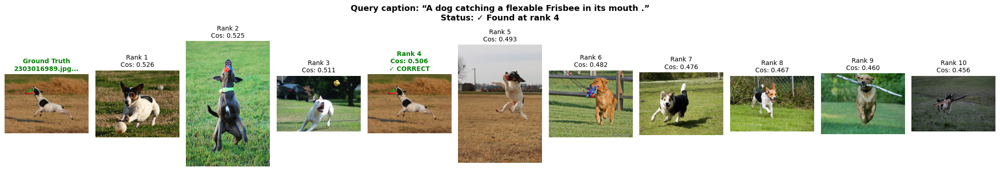


[2/15] cap_row=6978 → GT image idx=3236


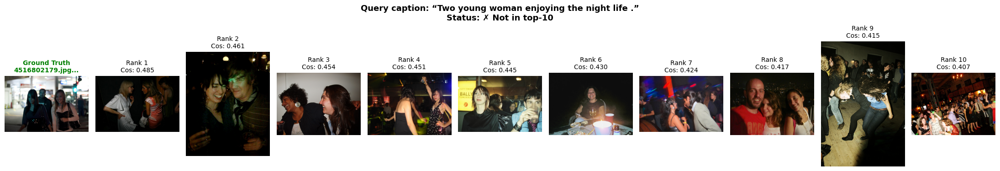


[3/15] cap_row=20517 → GT image idx=1345


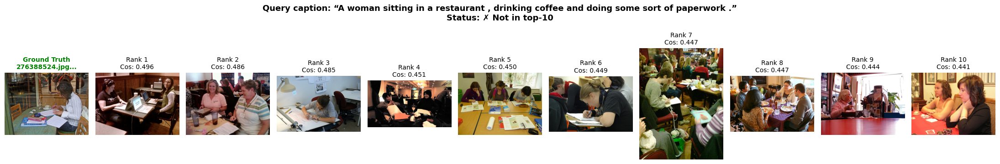


[4/15] cap_row=1678 → GT image idx=3632


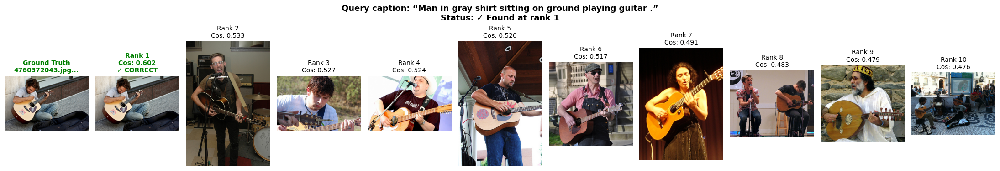


[5/15] cap_row=8121 → GT image idx=3042


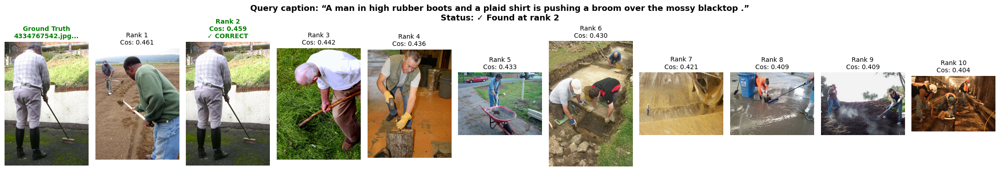


[6/15] cap_row=10588 → GT image idx=1120


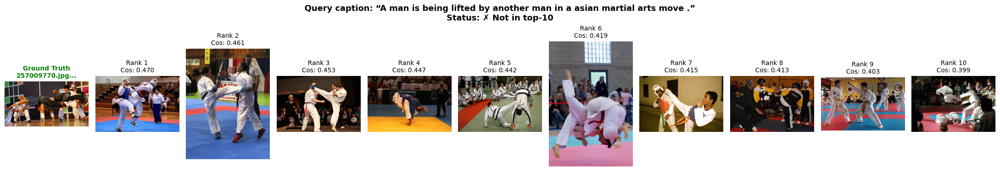


[7/15] cap_row=23565 → GT image idx=3669


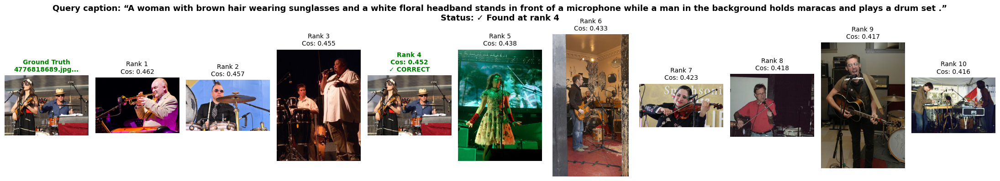


[8/15] cap_row=22057 → GT image idx=1834


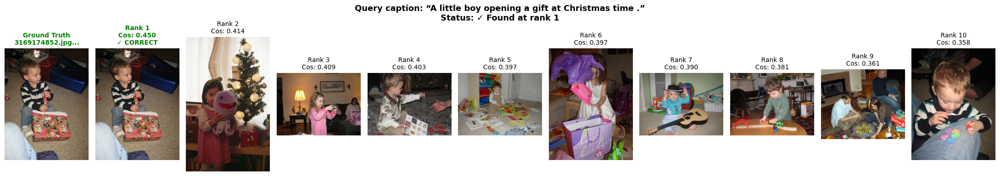


[9/15] cap_row=18254 → GT image idx=4403


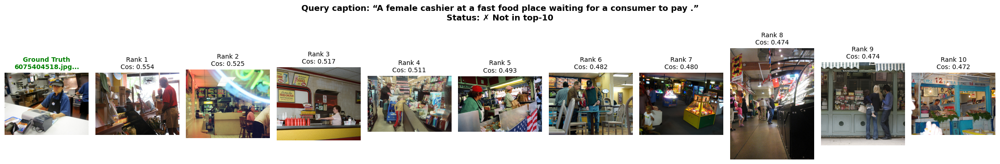


[10/15] cap_row=11300 → GT image idx=2545


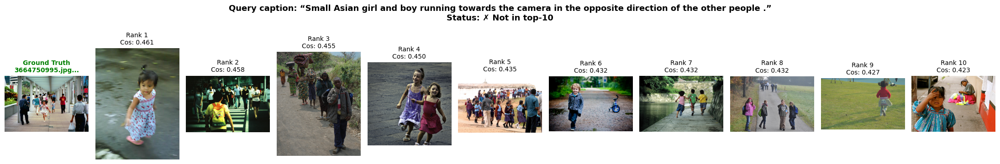


[11/15] cap_row=24486 → GT image idx=3714


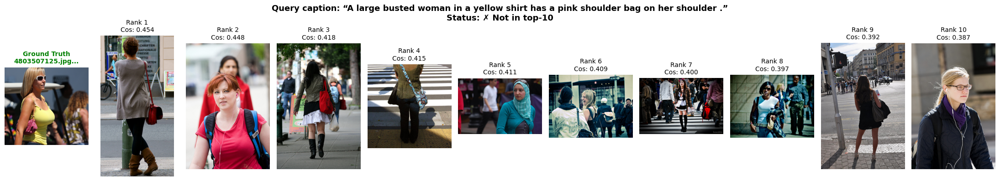


[12/15] cap_row=19214 → GT image idx=804


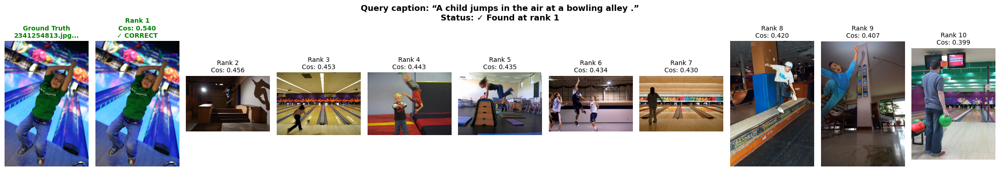


[13/15] cap_row=514 → GT image idx=4715


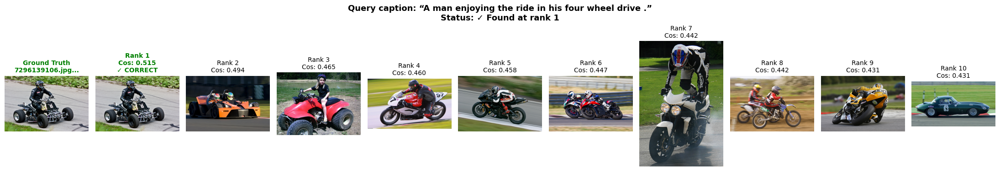


[14/15] cap_row=11321 → GT image idx=2246


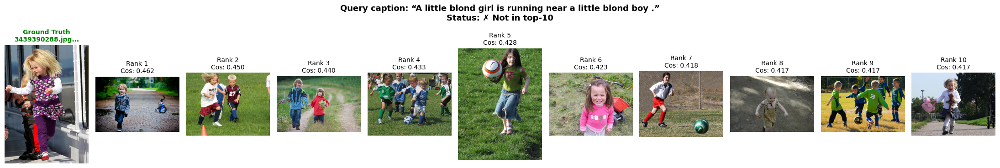


[15/15] cap_row=3302 → GT image idx=2317


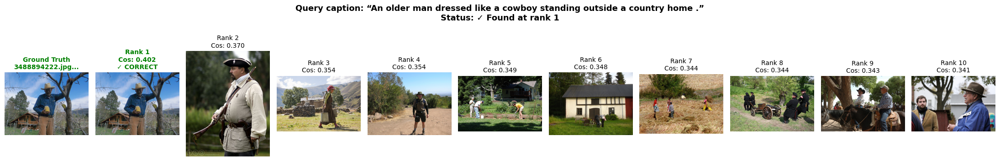

In [117]:

visualize_samples(
    model,
    text_embeddings=Xva,                 # torch.FloatTensor
    image_embeddings=val_gallery_t,      # torch.FloatTensor
    image_index_of_caption=cap2gal_local,
    image_files=image_files,
    caption_texts=caption_texts,
    n_examples=15,
    k=10
)


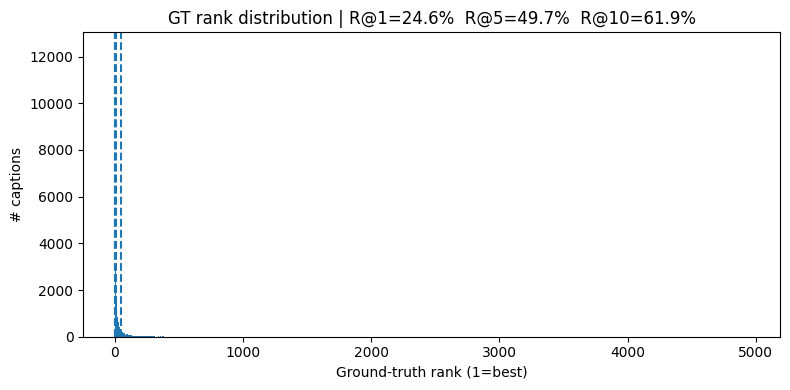

In [124]:
# 2) Compute ranks for the whole VAL split and plot a quick histogram
ranks = compute_gt_ranks(
    model,
    text_embeddings=Xva,                 # torch.FloatTensor
    image_embeddings=val_gallery_t,      # torch.FloatTensor
    image_index_of_caption=cap2gal_local,
    batch_size=512
)
plot_rank_hist(ranks)

